# Non stationary analysis

This is a tidy version of single_chanel_sim Notebook

## Frist simulate the ODE model

0.021370511000000647
0.07511538700001097


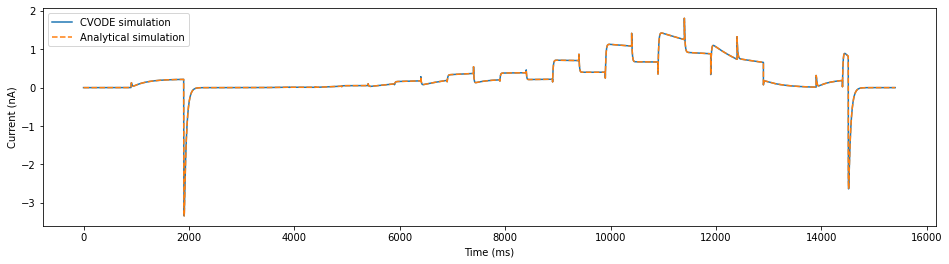

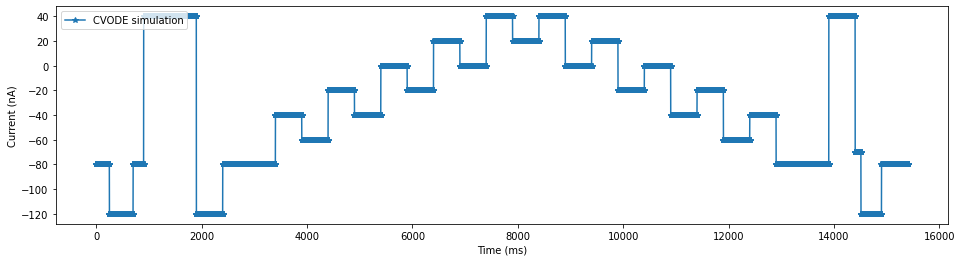

In [1]:
import matplotlib.pyplot as plt
import numpy as np

import myokit
import myokit.lib.markov

from scipy.interpolate import interp1d

# Load a model: this is the same model as before, but coded up as a Markov model (a kinetic scheme)
model = myokit.load_model('resources/beattie-2017-ikr-markov.mmt')

# Load a protocol
protocol = myokit.load_protocol('resources/simplified-staircase.mmt')

# Create a parametrisable Hodgkin-Huxley model
parameters = [
    'ikr.p1', 
    'ikr.p2', 
    'ikr.p3', 
    'ikr.p4', 
    'ikr.p5', 
    'ikr.p6', 
    'ikr.p7', 
    'ikr.p8', 
    'ikr.p9',
]
markov_model = myokit.lib.markov.LinearModel.from_component(model.get('ikr'), parameters=parameters)

# Create an analytical simulation
markov_sim = myokit.lib.markov.AnalyticalSimulation(markov_model, protocol)

# Create a CVODE simulation
cvode_sim = myokit.Simulation(model, protocol)

# Select times to log
tmax = 15400
times = np.arange(0, tmax, 0.1)

# Run a timed simulation with each method:
b = myokit.Benchmarker()
hh_log = markov_sim.run(tmax, log_times=times)
print(b.time())

b.reset()
cvode_log = cvode_sim.run(tmax, log_times=times, log=['ikr.IKr'])
print(b.time())

plt.figure(figsize=(16, 4))
plt.xlabel('Time (ms)')
plt.ylabel('Current (nA)')
plt.plot(times, hh_log['ikr.IKr'], '-', label='CVODE simulation')
plt.plot(times, cvode_log['ikr.IKr'], '--', label='Analytical simulation')
plt.legend(loc='upper left')
plt.show()

plt.figure(figsize=(16, 4))
plt.xlabel('Time (ms)')
plt.ylabel('Current (nA)')
plt.plot(times, hh_log['membrane.V'], '*-', label='CVODE simulation')
#plt.plot(times, cvode_log['ikr.IKr'], '--', label='Analytical simulation')
plt.legend(loc='upper left')
plt.show()

## Multiple single channel simulations with the same parameters, full protocol

Markov models can also be used for discrete, single channel, simulations. Each channel can be in 4 different states: Open (y3), Closed (y4), Inactive (y2), InactiveClosed (y1)

- Fix the seed
- Store multiple simulations
- "Interpolate" them into a fixed grid

Next cell simulate for full protocol. Skip it if you don't want to simulate again, and have the simulations stored already 

For saved simulations: 
- I saved them in my OneDrive, __too big to be in github__
- N= 100, m= 10000, tlog= 15200
- ACTUAL m = 2560
- File name: 'Ogrid.npy'





In [ ]:
# Start with a fixed N, and m number of simulations 
# For loop over m, save full simylations and interpolated ones

# parameters
tlog = 15200
N = 100
m = 10000
seed_m = np.arange(1,m+1,1)
time_grid = np.arange(0, tlog, 0.1) # every ms
O_full = {}
time_full = {}
O_inter = {}

# define the model and benchmarck to reset later
sim_N = myokit.lib.markov.DiscreteSimulation(markov_model, protocol, nchannels = N)
b = myokit.Benchmarker()

# Run many times
for i in range(m):
    if(i % 100 == 0):
        print('Iteration '+ str(i))
    np.random.seed(seed_m[i])
    log_N = sim_N.run(tlog)
    b.reset()
    sim_N.reset() 
    O_full[i] = np.array(log_N['ikr.y3']) 
    time_full[i] = np.array(log_N['engine.time'])
    O_inter[i] = interp1d(time_full[i], O_full[i],'previous', fill_value = "extrapolate")
    if i==0:
        O_grid = O_inter[i](time_grid)
    else:
        O_grid = np.vstack([O_grid,O_inter[i](time_grid)])

print('Simulating DONE, saving...')
np.save('Ogrid.npy',O_grid)

plt.figure(figsize=(15,4))
plt.plot(time_grid, O_grid[0,:], drawstyle='steps-post', label='grid')
plt.xlabel('time (ms)')
plt.ylabel('O')
plt.legend()
plt.show()

### NEW m from saved simulations:
m =2560

## Either load or simulate as indicated above

- Concatenate simualtions of N=100, to form simulations of N=1000 and N=10000
- Compute mean and varaince of all those posibles values of (N,m)


In [ ]:
# Calculate mean and variance over the m simulations
O_mean = np.mean(O_grid, axis = 0)
O_var = np.var(O_grid, axis = 0, ddof=1)
# Open probability
p_O_V1 = np.zeros(np.shape(O_var))#1 - O_var / O_mean
p_O_V1[O_mean>0]=1 - O_var[O_mean>0] / O_mean[O_mean>0]
p_O_V2 = O_mean / N
# ODE solutions
O_ode = np.array(hh_log['ikr.y3'])[:tlog*10]
time_ode = np.array(hh_log['engine.time'])[:tlog*10]

#plots
plt.figure(figsize=(15,4))
plt.title('Mean and Var open channels, [N,m] = ' + str([N,m]))
plt.plot(time_grid, O_mean, drawstyle='steps-post', label='mean')
plt.plot(time_grid, O_var, drawstyle='steps-post', label='var')
plt.xlabel('time (ms)')
plt.ylabel('O')
plt.legend()


plt.figure()
plt.title('Mean vs Var, [N,m] = ' + str([N,m]))
plt.plot(O_mean[1900*10:2000*10],O_var[19000:20000],'*', label = 'simulated')
plt.plot(O_mean[19000:20000],O_mean[19000:20000]*(1-O_mean[19000:20000]/N),'*', label = 'E(1-E/N)')
plt.xlabel('E, (i.e, mean)')
plt.ylabel('Var')
plt.legend()

plt.figure()
plt.title('Mean vs Var, full protocol, [N,m] = ' + str([N,m]))
plt.plot(O_mean,O_var,'*', label = 'simulated')
plt.plot(O_mean,O_mean*(1-O_mean/N),'*', label = 'E(1-E/N)')
plt.xlabel('E, (i.e, mean)')
plt.ylabel('Var')
plt.legend()

plt.show()


In [ ]:
# Let's check with N = 1000, m= 100

# Agregate the simulations
O_grid_N1000 = np.cumsum(O_grid,axis=0)
O_grid_N1000 = O_grid_N1000[np.arange(9, m, 10),:]
O_grid_N1000[1:,:] = O_grid_N1000[1:,:]-O_grid_N1000[:-1,:]

# Calculate mean and variance
O_mean_N1000 = np.mean(O_grid_N1000, axis = 0)
O_var_N1000 = np.var(O_grid_N1000, axis = 0, ddof=1)

# Now with N = 10000, m= 10

# Agregate the simulations
O_grid_N104 = np.cumsum(O_grid_N1000,axis=0)
O_grid_N104 = O_grid_N104[np.arange(9, int(m/10), 10),:]
O_grid_N104[1:,:] = O_grid_N104[1:,:]-O_grid_N104[:-1,:]

# Calculate mean and variance
O_mean_N104 = np.mean(O_grid_N104, axis = 0)
O_var_N104 = np.var(O_grid_N104, axis = 0, ddof=1)


plt.figure()
plt.title('Mean vs Var, [N,m] = ' + str([N*10,m/10]))
plt.plot(O_mean_N1000[19000:20000],O_var_N1000[19000:20000],'*', label = 'simulated')
plt.plot(O_mean_N1000[19000:20000],O_mean_N1000[19000:20000]*(1-O_mean_N1000[19000:20000]/(N*10)),'*', label = 'E(1-E/N)')
plt.xlabel('E, (i.e, mean)')
plt.ylabel('Var')
plt.legend()

plt.figure()
plt.title('Mean vs Var, full protocol, [N,m] = ' + str([N*10,m/10]))
plt.plot(O_mean_N1000,O_var_N1000,'*', label = 'simulated')
plt.plot(O_mean_N1000,O_mean_N1000*(1-O_mean_N1000/(N*10)),'*', label = 'E(1-E/N)')
plt.xlabel('E, (i.e, mean)')
plt.ylabel('Var')
plt.legend()


plt.figure()
plt.title('Mean vs Var, [N,m] = ' + str([N*100,int(m/100)]))
plt.plot(O_mean_N104[19000:20000],O_var_N104[19000:20000],'*', label = 'simulated')
plt.plot(O_mean_N104[19000:20000],O_mean_N104[19000:20000]*(1-O_mean_N104[19000:20000]/(N*100)),'*', label = 'E(1-E/N)')
plt.xlabel('E, (i.e, mean)')
plt.ylabel('Var')
plt.legend()

plt.figure()
plt.title('Mean vs Var, full protocol, [N,m] = ' + str([N*100,int(m/100)]))
plt.plot(O_mean_N104,O_var_N104,'*', label = 'simulated')
plt.plot(O_mean_N104,O_mean_N104*(1-O_mean_N104/(N*100)),'*', label = 'E(1-E/N)')
plt.xlabel('E, (i.e, mean)')
plt.ylabel('Var')
plt.legend()

plt.show()

In [ ]:
# Example of simulations
plt.figure(figsize=(15,4))
plt.title('Mean and 10 examples, [N,m] = ' + str([N*10,m/10]))
for i in range(10):
    plt.plot(time_grid, O_grid_N1000[i,:], drawstyle='steps-post', label='Sim'+str(i))
plt.plot(time_grid, O_mean_N1000, drawstyle='steps-post', label='mean')
plt.xlabel('time (ms)')
plt.ylabel('O')
plt.legend()

plt.show()

## Multiple simulations for part of protocol up to 2000 ms 

- Already saved, also in my onedrive since they are too big to github
- N=100, m=1000, tlog=2000
- filename 'Ogrid_tlog2000.npy'

Skip next cell and load data if no need for new simulations

In [ ]:
# Ok trying again m= 10,000 but with tlog =2000 instead of 15200, 
# pre-allocate the matrix to store the gridded results
# Do not store all the interpolation functions, only the current one and continue. 

# parameters
tlog = 2000
N = 100
m = 10000
seed_m = np.arange(1,m+1,1)
time_grid = np.arange(0, tlog, 0.1) # every ms
O_full = {}
time_full = {}

O_grid= np.zeros([m,tlog*10])

# define the model and benchmarck to reset later
sim_N = myokit.lib.markov.DiscreteSimulation(markov_model, protocol, nchannels = N)
b = myokit.Benchmarker()


# Run many times
for i in range(m):
    if(i % 100 == 0):
        print('Iteration '+ str(i))
    np.random.seed(seed_m[i])
    log_N = sim_N.run(tlog)
    b.reset()
    sim_N.reset() 
    O_full[i] = np.array(log_N['ikr.y3']) 
    time_full[i] = np.array(log_N['engine.time'])
    O_inter = interp1d(time_full[i], O_full[i],'previous', fill_value = "extrapolate")
    O_grid[i,:] = O_inter(time_grid)

print('Simulations DONE, saving...')


np.save('Ogrid_tlog2000.npy',O_grid)

plt.figure(figsize=(15,4))
plt.plot(time_grid, O_grid[0,:], drawstyle='steps-post', label='grid')
plt.xlabel('time (ms)')
plt.ylabel('O')
plt.legend()
plt.show()

## Load the data:

In [4]:
tlog = 2000
N = 100
m = 10000
time_grid = np.arange(0, tlog, 0.1)

O_grid= np.load('/Users/pmzah/OneDrive - The University of Nottingham/Postdoc/cardiacNoiseData/simulations_N_m/Ogrid_tlog2000.npy')

print(np.shape(O_grid))


(10000, 20000)


## Calculate mean and variance for multiple N,m pairs (protocol up to 2000ms)
- Agregate data into N-1000, and N=10000 tracks
- Calculate mean and variance

In [ ]:
# Repeat all the plots

# Agregate the simulations
O_grid_N1000 = np.cumsum(O_grid,axis=0)
O_grid_N1000 = O_grid_N1000[np.arange(9, m, 10),:]
O_grid_N1000[1:,:] = O_grid_N1000[1:,:]-O_grid_N1000[:-1,:]

O_grid_N104 = np.cumsum(O_grid_N1000,axis=0)
O_grid_N104 = O_grid_N104[np.arange(9, int(m/10), 10),:]
O_grid_N104[1:,:] = O_grid_N104[1:,:]-O_grid_N104[:-1,:]

# Calculate mean and variance over the m simulations, for the different subsets:
O_mean = np.mean(O_grid, axis = 0)
O_var = np.var(O_grid, axis = 0, ddof=1)

O_mean_N1000 = np.mean(O_grid_N1000, axis = 0)
O_var_N1000 = np.var(O_grid_N1000, axis = 0, ddof=1)

O_mean_N104 = np.mean(O_grid_N104, axis = 0)
O_var_N104 = np.var(O_grid_N104, axis = 0, ddof=1)

# Open probability for N=100
p_O_V1 = np.zeros(np.shape(O_var))#1 - O_var / O_mean
p_O_V1[O_mean>0]=1 - O_var[O_mean>0] / O_mean[O_mean>0]
p_O_V2 = O_mean / N
# ODE solutions
O_ode = np.array(hh_log['ikr.y3'])[:tlog*10]
time_ode = np.array(hh_log['engine.time'])[:tlog*10]



In [ ]:
#plots
plt.figure(figsize=(15,4))
plt.title('Mean/N for the different subsets ')
plt.plot(time_grid, O_mean/N, drawstyle='steps-post', label='[N,m]='+ str([N,m]))
plt.plot(time_grid, O_mean_N1000/(N*10), drawstyle='steps-post', label='[N,m]='+ str([N*10,int(m/10)]))
plt.plot(time_grid, O_mean_N104/(N*100), drawstyle='steps-post', label='[N,m]='+ str([N*100,int(m/100)]))
plt.plot(time_ode[:tlog*10], O_ode[:tlog*10], drawstyle='steps-post', label='O_ode')
plt.xlabel('time (ms)')
plt.ylabel('Mean/N = p_O')
plt.legend()

plt.figure(figsize=(15,4))
plt.title('Var/N for the different subsets ')
plt.plot(time_grid, O_var/N, drawstyle='steps-post', label='[N,m]='+ str([N,m]))
plt.plot(time_grid, O_var_N1000/(N*10), drawstyle='steps-post', label='[N,m]='+ str([N*10,int(m/10)]))
plt.plot(time_grid, O_var_N104/(N*100), drawstyle='steps-post', label='[N,m]='+ str([N*100,int(m/100)]))
#plt.plot(time_ode[:tlog*10], O_ode[:tlog*10], drawstyle='steps-post', label='O_ode')
plt.xlabel('time (ms)')
plt.ylabel('Var/N = p(1-p)')
plt.legend()


plt.figure(figsize=(15,4))
plt.title('Estimating p_0 (two versions), [N,m] = ' + str([N,m]))
plt.plot(time_grid, p_O_V2, drawstyle='steps-post', label='p_0=mean/N')
plt.plot(time_grid, p_O_V1, drawstyle='steps-post', label='p_0=1-var/mean')
plt.plot(time_ode, O_ode, drawstyle='steps-post', label='p_0=o_ode')
plt.xlabel('time (ms)')
plt.ylabel('p_O')
plt.legend()

plt.show()

In [ ]:
# Mean vs Var plots
plt.figure(figsize=(18, 5))
# N = 100
plt.subplot(1, 3, 1)
plt.title('Mean vs Var, [N,m] = ' + str([N,int(m)]))
plt.plot(O_mean[19000:],O_var[19000:],'*', label = 'simulated')
plt.plot(O_mean[19000:],O_mean[19000:]*(1-O_mean[19000:]/(N)),'*', label = 'E(1-E/N)')
plt.xlabel('E, (i.e, mean)')
plt.ylabel('Var')
plt.legend()
# N = 1000
plt.subplot(1, 3, 2)
plt.title('Mean vs Var, [N,m] = ' + str([N*10,int(m/10)]))
plt.plot(O_mean_N1000[19000:],O_var_N1000[19000:],'*', label = 'simulated')
plt.plot(O_mean_N1000[19000:],O_mean_N1000[19000:]*(1-O_mean_N1000[19000:]/(N*10)),'*', label = 'E(1-E/N)')
plt.xlabel('E, (i.e, mean)')
plt.ylabel('Var')
plt.legend()
# N = 10000
plt.subplot(1, 3, 3)
plt.title('Mean vs Var, [N,m] = ' + str([N*100,int(m/100)]))
plt.plot(O_mean_N104[19000:],O_var_N104[19000:],'*', label = 'simulated')
plt.plot(O_mean_N104[19000:],O_mean_N104[19000:]*(1-O_mean_N104[19000:]/(N*100)),'*', label = 'E(1-E/N)')
plt.xlabel('E, (i.e, mean)')
plt.ylabel('Var')
plt.legend()

plt.show()

In [ ]:
plt.figure(figsize=(20, 5))
# N = 10000
plt.subplot(1,3,1)
plt.title('Mean vs Var, [N,m] = ' + str([N*100,int(m/100)]))
plt.plot(O_mean_N104[:19000],O_var_N104[:19000],'2', label = '0-1900')
plt.plot(O_mean_N104[19000:19050],O_var_N104[19000:19050],'b2', label = '1900-1905')
plt.plot(O_mean_N104[19050:19200],O_var_N104[19050:19200],'2', label = '1905-1920')
plt.plot(O_mean_N104[19200:19500],O_var_N104[19200:19500],'2', label = '1920-1950')
plt.plot(O_mean_N104[19500:],O_var_N104[19500:],'*', label = '1950-2000')
plt.plot(O_mean_N104,O_mean_N104*(1-O_mean_N104/(N*100)),'r', label = 'E(1-E/N)')
plt.xlabel('E, (i.e, mean)')
plt.ylabel('Var')
plt.legend()

plt.subplot(1,3,2)
plt.title('Mean, [N,m] = ' + str([N*100,int(m/100)]))
plt.plot(time_grid[:19000],O_mean_N104[:19000],drawstyle='steps-post', label = '0-1900')
plt.plot(time_grid[19000:19050],O_mean_N104[19000:19050],'b', drawstyle='steps-post', label = '1900-1905')
plt.plot(time_grid[19050:19200],O_mean_N104[19050:19200],drawstyle='steps-post', label = '1905-1920')
plt.plot(time_grid[19200:19500],O_mean_N104[19200:19500],drawstyle='steps-post', label = '1920-1950')
plt.plot(time_grid[19500:],O_mean_N104[19500:],drawstyle='steps-post', label = '1950-2000')
plt.xlabel('time (ms)')
plt.ylabel('mean')
plt.legend()

V_ode = np.array(hh_log['membrane.V'])[:tlog*10]

plt.subplot(1,3,3)
plt.title('V ')
plt.plot(time_grid[:19000],V_ode[:19000],drawstyle='steps-post', label = '0-1900')
plt.plot(time_grid[19000:19050],V_ode[19000:19050],'b', drawstyle='steps-post', label = '1900-1905')
plt.plot(time_grid[19050:19200],V_ode[19050:19200],drawstyle='steps-post', label = '1905-1920')
plt.plot(time_grid[19200:19500],V_ode[19200:19500],drawstyle='steps-post', label = '1920-1950')
plt.plot(time_grid[19500:],V_ode[19500:],drawstyle='steps-post', label = '1950-2000')
plt.xlabel('time (ms)')

plt.ylabel('Var')
plt.legend()

plt.show()

In [ ]:
plt.figure(figsize=(20, 5))
plt.plot(time_full[80][time_full[80]>1890], O_full[80][time_full[80]>1890],'2', drawstyle='steps-post', label='full')
plt.show()

In [ ]:
plt.figure(figsize=(20, 5))
plt.plot(time_grid, O_grid_N104[0,:],'2', drawstyle='steps-post', label='N= 10000')
plt.show()



## One experiment analysis

Now we want to get teh variance and the mean from only one experiment. I'll start by binnng them by voltage. I think this protocol has 33 different Voltage levels. I think that when V is constant, then N and P are constant too. 

Maybe I get one more paramerter in this case, which is $O(T_i)$, where $T_i$ are the times where the voltage chages, so in a sense, the initial number of open channel at the change of voltage. I'm gonna ignore this part for now, and start with pure binning. 

__Big assumtpion__: N,p constant when V constant,

- I want "expected" trajectory with constant V and the deviation from that expected trajectory, would that be $O(t_i)|O(t_{i-1})$ ?
- Assuming binomial distribution, then they are independent, so each time is independent. 